<div class="alert alert-success">
    <h1> Beer Data Science Assignment <br/></h1>
    Knowledge Graph
</div>


In [1]:
from IPython.display import HTML
import pandas as pd
import os
import numpy as np
from datetime import datetime
import wordcloud
import warnings
import seaborn as sns; sns.set()
import matplotlib.pyplot as plt
from tqdm._tqdm_notebook import tqdm_notebook
tqdm_notebook.pandas()
warnings.filterwarnings('ignore')

BASE_PATH = "../"
INPUT_DATA_PATH = os.path.join(BASE_PATH, "data/raw/BeerDataScienceProject.csv")

/home/chetan/anaconda3/envs/chetan_ml/lib/python3.7/site-packages/ipykernel_launcher.py:10: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.*` instead of `tqdm._tqdm_notebook.*`
  # Remove the CWD from sys.path while we load stuff.


In [3]:
import io
df_beer_raw = pd.read_csv(INPUT_DATA_PATH, encoding="ISO-8859-1")

In [4]:
df_beer_raw.shape

(528870, 13)

In [5]:
df_beer_raw.dtypes

beer_ABV              float64
beer_beerId             int64
beer_brewerId           int64
beer_name              object
beer_style             object
review_appearance     float64
review_palette        float64
review_overall        float64
review_taste          float64
review_profileName     object
review_aroma          float64
review_text            object
review_time             int64
dtype: object

### Data Cleaning
```In the below cell we can see that there are some columns where data is missing. 
   We need to remove those data points from our data set.
```

In [6]:
df_beer_raw.isna().sum()

beer_ABV              20280
beer_beerId               0
beer_brewerId             0
beer_name                 0
beer_style                0
review_appearance         0
review_palette            0
review_overall            0
review_taste              0
review_profileName      115
review_aroma              0
review_text             119
review_time               0
dtype: int64

In [7]:
df_beer = df_beer_raw.dropna()

In [8]:
df_beer.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 508358 entries, 0 to 528796
Data columns (total 13 columns):
beer_ABV              508358 non-null float64
beer_beerId           508358 non-null int64
beer_brewerId         508358 non-null int64
beer_name             508358 non-null object
beer_style            508358 non-null object
review_appearance     508358 non-null float64
review_palette        508358 non-null float64
review_overall        508358 non-null float64
review_taste          508358 non-null float64
review_profileName    508358 non-null object
review_aroma          508358 non-null float64
review_text           508358 non-null object
review_time           508358 non-null int64
dtypes: float64(6), int64(3), object(4)
memory usage: 54.3+ MB


In [9]:
df_beer = df_beer.reset_index()
df_beer['id'] = df_beer.index

## Data Changes in Raw and Clean dataset

In [10]:
print("Raw data size: ", df_beer_raw.shape[0])
print("Clean data size: ", df_beer.shape[0])
print("Data points difference: ", df_beer_raw.shape[0]-df_beer.shape[0])

Raw data size:  528870
Clean data size:  508358
Data points difference:  20512


## Knowledge Graph Creation using Review-text

In [11]:
import pandas as pd
import re
import spacy
import neuralcoref

nlp = spacy.load('en')
neuralcoref.add_to_pipe(nlp)


def entity_pairs(text, coref=True):
    text = re.sub(r'\n+', '.', text)  # replace multiple newlines with period
    text = re.sub(r'\[\d+\]', ' ', text)  # remove reference numbers
    text = nlp(text)
    if coref:
        text = nlp(text._.coref_resolved)  # resolve coreference clusters
    sentences = [sent.string.strip() for sent in text.sents]  # split text into sentences
    ent_pairs = list()
    for sent in sentences:
        sent = nlp(sent)
        spans = list(sent.ents) + list(sent.noun_chunks)  # collect nodes
        spans = spacy.util.filter_spans(spans)
        with sent.retokenize() as retokenizer:
            [retokenizer.merge(span) for span in spans]
        dep = [token.dep_ for token in sent]
        if (dep.count('obj')+dep.count('dobj'))==1 \
                and (dep.count('subj')+dep.count('nsubj'))==1:
            for token in sent:
                if token.dep_ in ('obj', 'dobj'):  # identify object nodes
                    subject = [w for w in token.head.lefts if w.dep_
                               in ('subj', 'nsubj')]  # identify subject nodes
                    if subject:
                        subject = subject[0]
                        # identify relationship by root dependency
                        relation = [w for w in token.ancestors if w.dep_ == 'ROOT']  
                        if relation:
                            relation = relation[0]
                            # add adposition or particle to relationship
                            if relation.nbor(1).pos_ in ('ADP', 'PART'):  
                                relation = ' '.join((str(relation),
                                        str(relation.nbor(1))))
                        else:
                            relation = 'unknown'
                        subject, subject_type = refine_ent(subject, sent)
                        token, object_type = refine_ent(token, sent)
                        ent_pairs.append([str(subject), str(relation), str(token),
                                str(subject_type), str(object_type)])
    filtered_ent_pairs = [sublist for sublist in ent_pairs
                          if not any(str(x) == '' for x in sublist)]
    pairs = pd.DataFrame(filtered_ent_pairs, columns=['subject',
                         'relation', 'object', 'subject_type',
                         'object_type'])
    #print('Entity pairs extracted:', str(len(filtered_ent_pairs)))
    return pairs


def refine_ent(ent, sent):
    unwanted_tokens = (
        'PRON',  # pronouns
        'PART',  # particle
        'DET',  # determiner
        'SCONJ',  # subordinating conjunction
        'PUNCT',  # punctuation
        'SYM',  # symbol
        'X',  # other
        )
    ent_type = ent.ent_type_  # get entity type
    if ent_type == '':
        ent_type = 'NOUN_CHUNK'
        ent = ' '.join(str(t.text) for t in
                nlp(str(ent)) if t.pos_
                not in unwanted_tokens and t.is_stop == False)
    elif ent_type in ('NOMINAL', 'CARDINAL', 'ORDINAL') and str(ent).find(' ') == -1:
        t = ''
        for i in range(len(sent) - ent.i):
            if ent.nbor(i).pos_ not in ('VERB', 'PUNCT'):
                t += ' ' + str(ent.nbor(i))
            else:
                ent = t.strip()
                break
    return ent, ent_type

In [19]:
df_beer.beer_name.value_counts()

Sierra Nevada Celebration Ale                 2998
Sierra Nevada Pale Ale                        2586
Founders Breakfast Stout                      2501
Sierra Nevada Bigfoot Barleywine Style Ale    2491
La Fin Du Monde                               2480
Samuel Adams Boston Lager                     2416
Chocolate Stout                               2233
Dead Guy Ale                                  2229
Trappistes Rochefort 10                       2170
Sierra Nevada Torpedo Extra IPA               2028
Samuel Smith's Oatmeal Stout                  2024
Chimay Grande Réserve (Blue)                  2008
Racer 5 India Pale Ale                        1970
Tröegs Nugget Nectar                          1953
Founders KBS (Kentucky Breakfast Stout)       1928
Orval Trappist Ale                            1918
Hop Rod Rye                                   1912
Samuel Adams Octoberfest                      1891
Samuel Adams Winter Lager                     1824
Trois Pistoles                 

In [20]:
review_data = df_beer[df_beer.beer_name=="Sierra Nevada Celebration Ale"]['review_text'].tolist()
#pairs = [".".join(review_data[i:i+10]) for i in range(0,len(review_data),10)]
pairs = review_data


In [21]:
frames = []
for data in tqdm_notebook(pairs):
    try:
        df_temp = entity_pairs(data)
        frames.append(df_temp)
    except Exception as e:
        pass



In [22]:
df_res = pd.concat(frames)

In [23]:
df_res.head(100)

,subject,relation,object,subject_type,object_type
0,beer,pours,nice clear amber color,NOUN_CHUNK,NOUN_CHUNK
0,inhale,consumes,nose,NOUN_CHUNK,NOUN_CHUNK
1,mouthfeel,puts,beer,NOUN_CHUNK,NOUN_CHUNK
2,mouthfeel,has,bit body,NOUN_CHUNK,NOUN_CHUNK
0,Sierra Celebration,is,medium amber color,ORG,NOUN_CHUNK
1,aroma,has,nice crisp hoppiness,NOUN_CHUNK,NOUN_CHUNK
0,Hops,continue,earthy trend,NOUN_CHUNK,NOUN_CHUNK
0,T,Follows,nose,NOUN_CHUNK,NOUN_CHUNK
0,excellent carbonation,keeps,excellent carbonation,NOUN_CHUNK,NOUN_CHUNK
0,Malt,supports,Malt,NOUN_CHUNK,NOUN_CHUNK


In [24]:
df_res[df_res.subject_type=='ORG']

,subject,relation,object,subject_type,object_type
0,Sierra Celebration,is,medium amber color,ORG,NOUN_CHUNK
0,growler,filled,pint glass thin layer,ORG,NOUN_CHUNK
0,Sierra,An attractive beer,APAs,ORG,NOUN_CHUNK
0,Grapefruit,dominate,pungent bouquet,ORG,NOUN_CHUNK
0,My local Wegman,has,limited selection,ORG,NOUN_CHUNK
0,SN,brews,high quality beers,ORG,NOUN_CHUNK
0,Low-ish ABV,lends,Low ish ABV,ORG,NOUN_CHUNK
0,The MF,suits,flavors,ORG,NOUN_CHUNK
0,SN Celebration,pours,hazy amber color,ORG,NOUN_CHUNK
0,Sierra Nevada Celebration Ale,pours,dark amber,ORG,NOUN_CHUNK


In [25]:
df_res.object_type.value_counts()

NOUN_CHUNK     1197
ORG               9
DATE              7
PERSON            6
TIME              3
CARDINAL          3
QUANTITY          2
PERCENT           2
GPE               2
LOC               1
WORK_OF_ART       1
FAC               1
MONEY             1
Name: object_type, dtype: int64

In [26]:
import networkx as nx
import matplotlib.pyplot as plt


def draw_kg(pairs):
    k_graph = nx.from_pandas_edgelist(pairs, 'subject', 'object',
            create_using=nx.MultiDiGraph())
    node_deg = nx.degree(k_graph)
    layout = nx.spring_layout(k_graph, k=0.15, iterations=20)
    plt.figure(num=None, figsize=(120, 90), dpi=80)
    nx.draw_networkx(
        k_graph,
        node_size=[int(deg[1]) * 500 for deg in node_deg],
        arrowsize=20,
        linewidths=1.5,
        pos=layout,
        edge_color='red',
        edgecolors='black',
        node_color='white',
        )
    labels = dict(zip(list(zip(pairs.subject, pairs.object)),
                  pairs['relation'].tolist()))
    nx.draw_networkx_edge_labels(k_graph, pos=layout, edge_labels=labels,
                                 font_color='red')
    plt.axis('off')
    plt.show()

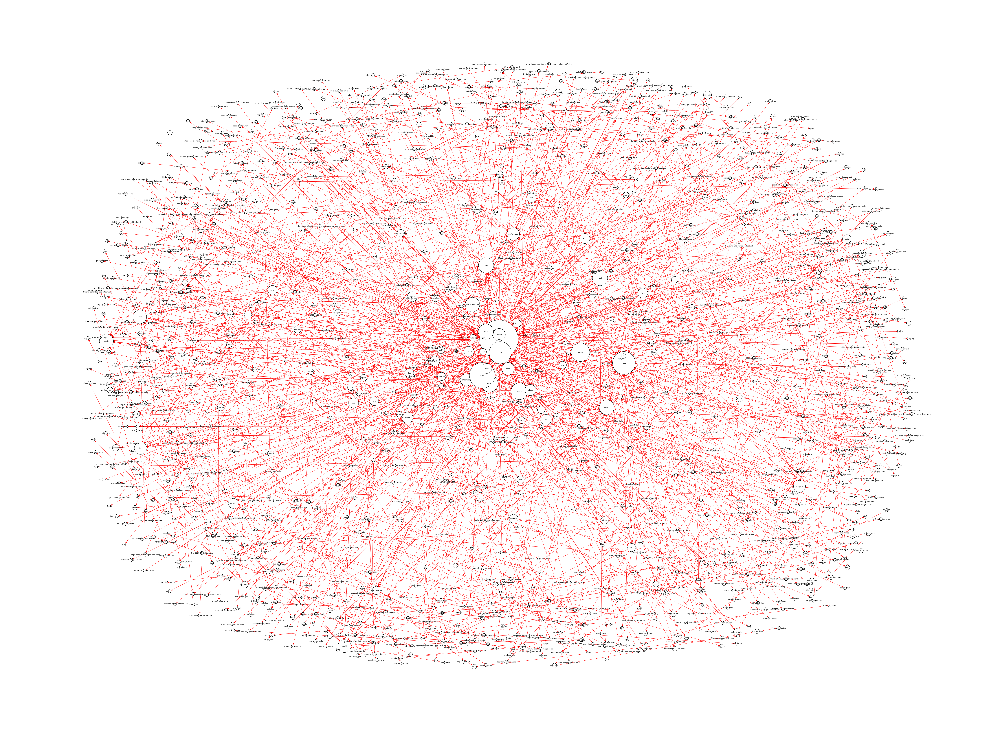

In [27]:
draw_kg(df_res)


In [28]:
def filter_graph(pairs, node):
    k_graph = nx.from_pandas_edgelist(pairs, 'subject', 'object',
            create_using=nx.MultiDiGraph())
    edges = nx.dfs_successors(k_graph, node)
    nodes = []
    for k, v in edges.items():
        nodes.extend([k])
        nodes.extend(v)
    subgraph = k_graph.subgraph(nodes)
    layout = (nx.random_layout(k_graph))
    nx.draw_networkx(
        subgraph,
        node_size=1000,
        arrowsize=20,
        linewidths=1.5,
        pos=layout,
        edge_color='red',
        edgecolors='black',
        node_color='white'
        )
    labels = dict(zip((list(zip(pairs.subject, pairs.object))),
                    pairs['relation'].tolist()))
    edges= tuple(subgraph.out_edges(data=False))
    sublabels ={k: labels[k] for k in edges}
    #print(k_graph.out_edges(data=False))
    nx.draw_networkx_edge_labels(subgraph, pos=layout, edge_labels=sublabels,
                                font_color='red')
    plt.axis('off')
    plt.show()

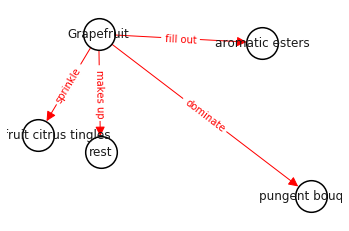

In [33]:
filter_graph(df_res, 'Grapefruit')
